# **Description of the dataset 📝**
*This dataset is created using offline augmentation from the original dataset.
This dataset consists of about 87K rgb images of healthy and diseased crop leaves which is categorized into 38 different classes.
A new directory containing 33 test images is created later for prediction purpose.
*
* data at link: [https://www.kaggle.com/datasets/vipoooool/new-plant-diseases-dataset/data](http://)

# **Our goal 🎯**
*Goal is clear and simple. We need to build a model, which can classify between healthy and diseased crop leaves and also if the crop have any disease, predict which disease is it.*

# Let's import required modules..



In [1]:
# Ignore warnings
import warnings
warnings.filterwarnings("ignore")

# Import necessary libraries
import tensorflow as tf  # TensorFlow for machine learning tasks
import seaborn as sns    # Seaborn for statistical visualization
import matplotlib.pyplot as plt  # Matplotlib for plotting
from tensorflow import keras     # Keras for building neural networks
import numpy as np      # NumPy for numerical computations
import os              # OS module for interacting with the operating system
import pandas as pd    # Pandas for data manipulation and analysis
import itertools       # Itertools for creating iterators
from tensorflow.keras.utils import image_dataset_from_directory  # Utility for loading image datasets
from tensorflow.keras.layers import BatchNormalization, Dropout   # Layers for neural networks
from sklearn.metrics import precision_score, accuracy_score, recall_score, confusion_matrix, ConfusionMatrixDisplay  # Metrics for model evaluation
from tensorflow.keras.preprocessing import image   # Utility for image preprocessing

2024-04-24 23:12:22.298756: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-04-24 23:12:22.298816: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-04-24 23:12:22.300478: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


# **Exploring the data 🧭**
*note that data in kaggle exist and ready to use..*


In [2]:
#Loading the data..^_^

# Define the paths to the training and validation datasets
train_data = "../input/new-plant-diseases-dataset/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/train"
valid_data = "../input/new-plant-diseases-dataset/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/valid"

# Load the training and validation dataset as an image dataset
train_gen = image_dataset_from_directory(directory=train_data, image_size=(256, 256))
valid_gen = image_dataset_from_directory(directory=valid_data, image_size=(256, 256))

# Normalize the pixel values of images in the training and validation dataset
train_gen = train_gen.map(lambda image, label: (image / 255.0, label))
valid_gen = valid_gen.map(lambda image, label: (image / 255.0, label))

Found 70295 files belonging to 38 classes.
Found 17572 files belonging to 38 classes.


In [3]:
#Our Classes^_^

# Get the list of class names by listing directories in the training dataset
class_names = sorted(os.listdir("../input/new-plant-diseases-dataset/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/train"))
# Print the total number of classes
print(f'The total number of classes is: {len(class_names)}')

# Iterate through the class names and print each one
for class_name in class_names:
    print(class_name)

The total number of classes is: 38
Apple___Apple_scab
Apple___Black_rot
Apple___Cedar_apple_rust
Apple___healthy
Blueberry___healthy
Cherry_(including_sour)___Powdery_mildew
Cherry_(including_sour)___healthy
Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot
Corn_(maize)___Common_rust_
Corn_(maize)___Northern_Leaf_Blight
Corn_(maize)___healthy
Grape___Black_rot
Grape___Esca_(Black_Measles)
Grape___Leaf_blight_(Isariopsis_Leaf_Spot)
Grape___healthy
Orange___Haunglongbing_(Citrus_greening)
Peach___Bacterial_spot
Peach___healthy
Pepper,_bell___Bacterial_spot
Pepper,_bell___healthy
Potato___Early_blight
Potato___Late_blight
Potato___healthy
Raspberry___healthy
Soybean___healthy
Squash___Powdery_mildew
Strawberry___Leaf_scorch
Strawberry___healthy
Tomato___Bacterial_spot
Tomato___Early_blight
Tomato___Late_blight
Tomato___Leaf_Mold
Tomato___Septoria_leaf_spot
Tomato___Spider_mites Two-spotted_spider_mite
Tomato___Target_Spot
Tomato___Tomato_Yellow_Leaf_Curl_Virus
Tomato___Tomato_mosaic_viru

In [4]:
# Identify unique plants and count the number of diseases ^_^

# Get the list of diseases by listing directories in the training data
diseases = os.listdir(train_data)
# Initialize lists to store unique plants and count the number of diseases
plants = []
NumberOfDiseases = 0

# Iterate through each disease
for plant in diseases:
    # Check if the plant name is not already in the list of unique plants
    if plant.split('_')[0] not in plants:
        # Add the unique plant name to the list
        plants.append(plant.split('_')[0])
    # Check if the disease is not labeled as 'healthy'
    if plant.split('_')[1] != 'healthy':
        # Increment the count of diseases
        NumberOfDiseases += 1

# Print the number of unique plants in the dataset
print("Number of plants: {}".format(len(plants)))
print('-'*50)
print(f"Unique Plants are: \n{plants}")
print()

# Print the number of unique diseases (excluding 'healthy')
print("Number of unique diseases (without healthy): {}".format(NumberOfDiseases))
print('-'*50)
print(f"Unique Plants are: \n{diseases}")


Number of plants: 14
--------------------------------------------------
Unique Plants are: 
['Tomato', 'Grape', 'Orange', 'Soybean', 'Squash', 'Potato', 'Corn', 'Strawberry', 'Peach', 'Apple', 'Blueberry', 'Cherry', 'Pepper,', 'Raspberry']

Number of unique diseases(without healthy): 38
--------------------------------------------------
Unique Plants are: 
['Tomato___Late_blight', 'Tomato___healthy', 'Grape___healthy', 'Orange___Haunglongbing_(Citrus_greening)', 'Soybean___healthy', 'Squash___Powdery_mildew', 'Potato___healthy', 'Corn_(maize)___Northern_Leaf_Blight', 'Tomato___Early_blight', 'Tomato___Septoria_leaf_spot', 'Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot', 'Strawberry___Leaf_scorch', 'Peach___healthy', 'Apple___Apple_scab', 'Tomato___Tomato_Yellow_Leaf_Curl_Virus', 'Tomato___Bacterial_spot', 'Apple___Black_rot', 'Blueberry___healthy', 'Cherry_(including_sour)___Powdery_mildew', 'Peach___Bacterial_spot', 'Apple___Cedar_apple_rust', 'Tomato___Target_Spot', 'Pepper,_bel

In [5]:
#LOOK at shape of one photo :)

# Define the path to the image file
import cv2
img_path = "/kaggle/input/new-plant-diseases-dataset/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/train/Apple___Apple_scab/00075aa8-d81a-4184-8541-b692b78d398a___FREC_Scab 3335.JPG"
# Read the image using OpenCV
img = cv2.imread(img_path)
# Print the shape of the image
print("Image shape:", img.shape)


Image shape: (256, 256, 3)


# **Data visualization 📊**
*some calculations of the data samples*

In [6]:
#Empty dictionaries to store count of images for each class in training and validation datasets ^_^
nums_train = {}
nums_valid = {}

# Iterate over each disease in the list of diseases
for disease in diseases:
    #Count and store number of images for the current disease in the training and validation dataset 
    nums_train[disease] = len(os.listdir(train_data+'/'+disease))
    nums_valid[disease] = len(os.listdir(vaild_data+'/'+disease))

# Create pandas DataFrames to display the count of images for each disease in the training and validation datasets
image_class_count_train = pd.DataFrame(nums_train.values(), index=nums_train.keys(), columns=['No. of images'])
image_class_count_valid = pd.DataFrame(nums_valid.values(), index=nums_valid.keys(), columns=['No. of images'])


Training data images count per class : 
                                                    No. of images
Tomato___Late_blight                                         1851
Tomato___healthy                                             1926
Grape___healthy                                              1692
Orange___Haunglongbing_(Citrus_greening)                     2010
Soybean___healthy                                            2022
Squash___Powdery_mildew                                      1736
Potato___healthy                                             1824
Corn_(maize)___Northern_Leaf_Blight                          1908
Tomato___Early_blight                                        1920
Tomato___Septoria_leaf_spot                                  1745
Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot           1642
Strawberry___Leaf_scorch                                     1774
Peach___healthy                                              1728
Apple___Apple_scab                  

<Axes: title={'center': 'Training data images count per class'}, xlabel='Number of images', ylabel='Classes'>

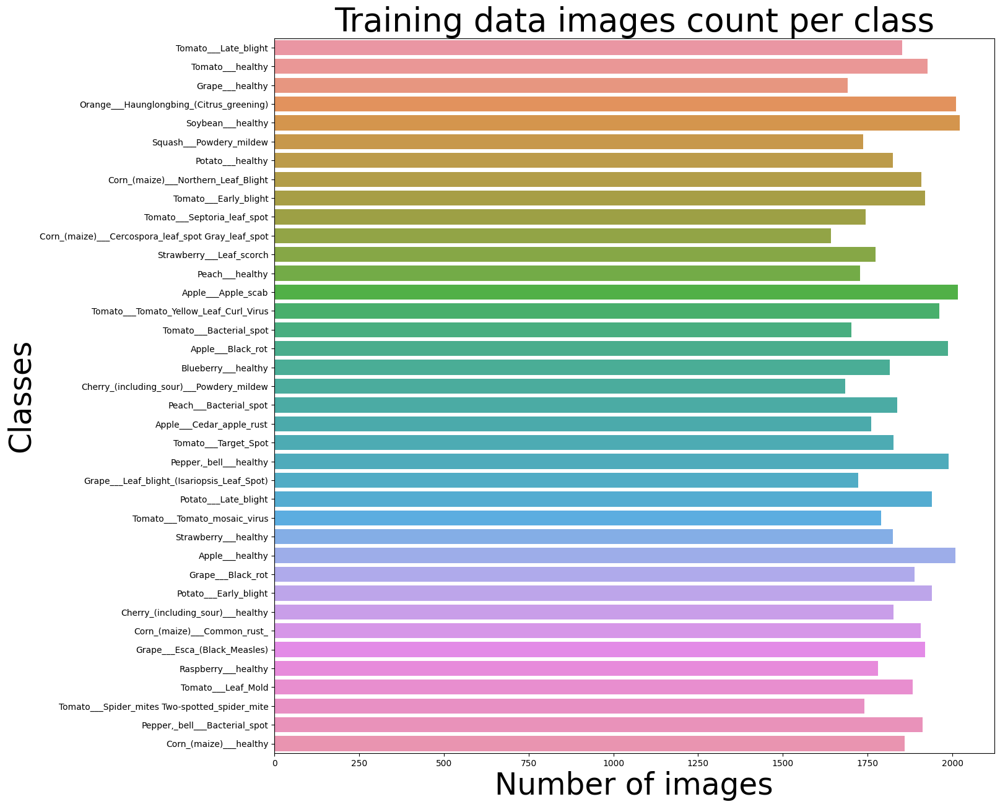

In [7]:
# Print the count of training data images per class ^_^
print('Training data images count per class : ')
print(image_class_count_train)

# Create a bar plot showing the count of training images per class
plt.figure(figsize=(15,15))
plt.title("Training data images count per class",fontsize=38)
plt.xlabel('Number of images', fontsize=35)
plt.ylabel('Classes', fontsize=35)

# Extract keys and values from the dictionary
keys = list(nums_train.keys())
vals = list(nums_train.values())

# Plot the bar plot using seaborn
sns.barplot(y=keys, x=vals)


Validation data images count per class : 
                                                    No. of images
Tomato___Late_blight                                          463
Tomato___healthy                                              481
Grape___healthy                                               423
Orange___Haunglongbing_(Citrus_greening)                      503
Soybean___healthy                                             505
Squash___Powdery_mildew                                       434
Potato___healthy                                              456
Corn_(maize)___Northern_Leaf_Blight                           477
Tomato___Early_blight                                         480
Tomato___Septoria_leaf_spot                                   436
Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot            410
Strawberry___Leaf_scorch                                      444
Peach___healthy                                               432
Apple___Apple_scab                

<Axes: title={'center': 'Validation data images count per class'}, xlabel='Number of images', ylabel='Classes'>

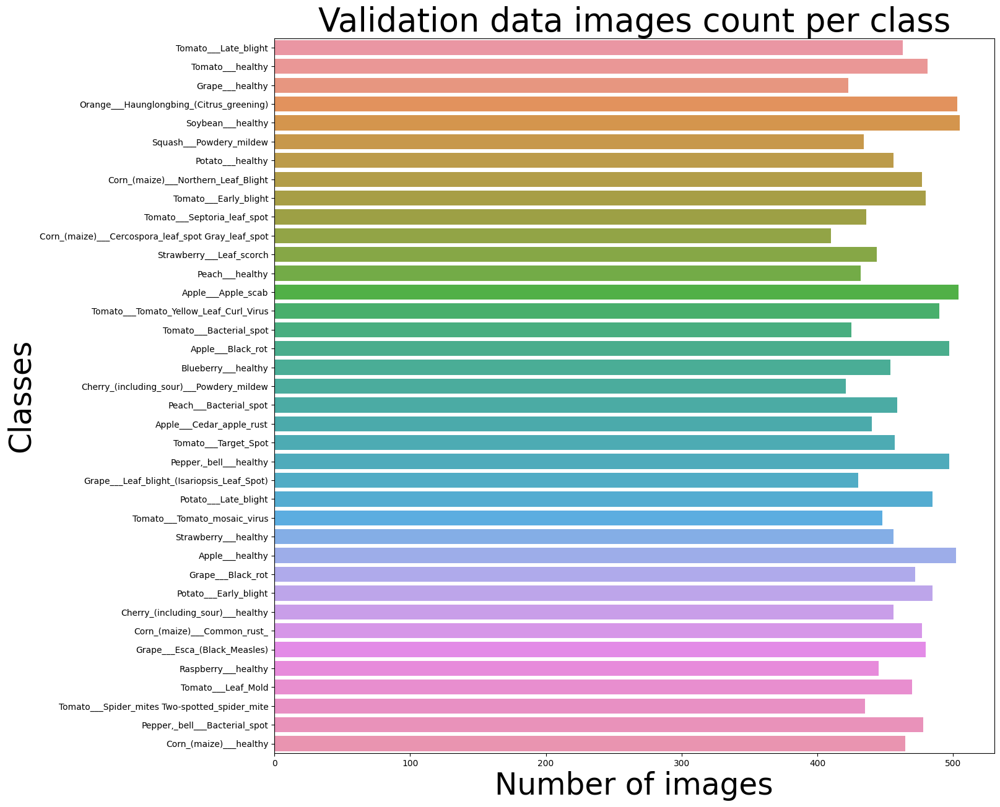

In [8]:
# Print the count of validation data images per class ^_^
print('Validation data images count per class : ')
print(image_class_count_valid)

# Create a bar plot showing the count of validation images per class
plt.figure(figsize=(15,15))
plt.title("Validation data images count per class",fontsize=38)
plt.xlabel('Number of images', fontsize=35)
plt.ylabel('Classes', fontsize=35)

# Extract keys and values from the dictionary
keys = list(nums_valid.keys())
vals = list(nums_valid.values())

# Plot the bar plot using seaborn
sns.barplot(y=keys, x=vals)


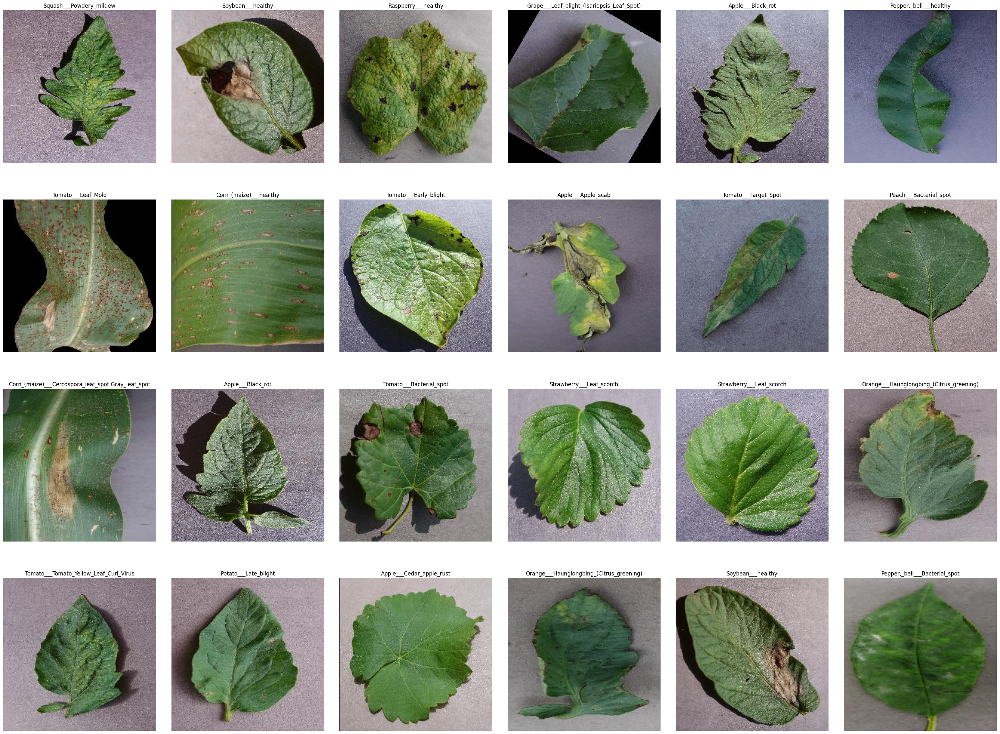

In [9]:
# Visualize Images :)

plt.figure(figsize=(40,30))#Set figure size to 40 inches in width and 30 inches in height
plt.subplots_adjust(wspace=0.1,hspace=0.1)# width and height space between subplots to 0.1

# Iterate over a range of 24 (to display 24 images)
for i in range(24):
    #Get a random folder index within the range of available folders in the training data
    random_folder = np.random.randint(0, len(os.listdir(train_data)))
    #Get the path of the randomly selected folder
    random_folder_path = os.path.join(train_data, os.listdir(train_data)[random_folder])  
    #Get a random image index within the range of available images in the selected folder
    random_image = np.random.randint(0, len(os.listdir(random_folder_path))) 
    
    #Get the path of the randomly selected image and Read the image using OpenCV
    random_image_path = os.path.join(random_folder_path, os.listdir(random_folder_path)[random_image])  
    image = cv2.imread(random_image_path)  
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB) #Convert the image from (BGR to RGB) 
    
    #Get the class name for the current image
    class_name = class_names[random_folder]  
    
    # Create a subplot with 4 rows and 6 columns, and set the current subplot index
    plt.subplot(4, 6, i + 1)  
    plt.imshow(image)#Display the image
    plt.axis("off")#Turn off the axis
    plt.title(class_name)#Set the title of the subplot to the class name  
    
# Display the entire plot
plt.show()


# **Modelling 🏗️**
* *It is advisable to use GPU instead of CPU when dealing with images dataset because CPUs are generalized for general purpose and GPUs are optimized for training deep learning models as they can process multiple computations simultaneously.*
* *They have a large number of cores, which allows for better computation of multiple parallel processes.*
* *Additionally, computations in deep learning need to handle huge amounts of data, this makes a GPU’s memory bandwidth most suitable.*

# **Building the model architecture 👷**
*We are going to use CNN..*

In [10]:
model = keras.Sequential()

model.add(keras.layers.Conv2D(32,(3,3),activation="relu",padding="same",input_shape=(256,256,3)))
model.add(keras.layers.Conv2D(32,(3,3),activation="relu",padding="same"))
model.add(keras.layers.MaxPooling2D(3,3))
model.add(BatchNormalization())

model.add(keras.layers.Conv2D(64,(3,3),activation="relu",padding="same"))
model.add(keras.layers.Conv2D(64,(3,3),activation="relu",padding="same"))
model.add(keras.layers.MaxPooling2D(3,3))

model.add(keras.layers.Conv2D(128,(3,3),activation="relu",padding="same"))
model.add(keras.layers.Conv2D(128,(3,3),activation="relu",padding="same"))
model.add(keras.layers.MaxPooling2D(3,3))
model.add(BatchNormalization())

model.add(keras.layers.Conv2D(256,(3,3),activation="relu",padding="same"))
model.add(keras.layers.Conv2D(256,(3,3),activation="relu",padding="same"))

model.add(keras.layers.Conv2D(512,(5,5),activation="relu",padding="same"))
model.add(keras.layers.Conv2D(512,(5,5),activation="relu",padding="same"))

model.add(keras.layers.Flatten())

model.add(keras.layers.Dense(1568,activation="relu"))
model.add(keras.layers.Dropout(0.5))
model.add(BatchNormalization())
model.add(keras.layers.Dense(38,activation="softmax"))

opt = keras.optimizers.Adam(learning_rate=0.0001)
model.compile(optimizer=opt,loss="sparse_categorical_crossentropy",metrics=['accuracy'])
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 256, 256, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 256, 256, 32)   │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 85, 85, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 85, 85, 32)     │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 85, 85, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 85, 85, 64)     │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 28, 28, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 28, 28, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 28, 28, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 9, 9, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 9, 9, 128)      │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (None, 9, 9, 256)      │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (None, 9, 9, 256)      │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_8 (Conv2D)               │ (None, 9, 9, 512)      │     3,277,312 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_9 (Conv2D)               │ (None, 9, 9, 512)      │     6,554,112 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 41472)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 1568)           │    65,029,664 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 1568)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 1568)           │         6,272 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 38)             │        59,622 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 76,099,878 (290.30 MB)

 Trainable params: 76,096,422 (290.28 MB)

 Non-trainable params: 3,456 (13.50 KB)

# **Training the model.. 🏋️**

In [11]:
# Train the model on the training data and validate it on the validation data ^_^
history = model.fit(
    train_gen,  # Training data generator
    validation_data=vaild_gen,  # Validation data generator
    epochs=10  # Number of epochs for training
)


Epoch 1/10


2024-04-24 23:13:21.432590: E external/local_xla/xla/service/slow_operation_alarm.cc:65] Trying algorithm eng0{} for conv (f32[32,32,3,3]{3,2,1,0}, u8[0]{0}) custom-call(f32[32,32,256,256]{3,2,1,0}, f32[32,32,256,256]{3,2,1,0}), window={size=3x3 pad=1_1x1_1}, dim_labels=bf01_oi01->bf01, custom_call_target="__cudnn$convBackwardFilter", backend_config={"conv_result_scale":1,"activation_mode":"kNone","side_input_scale":0,"leakyrelu_alpha":0} is taking a while...
2024-04-24 23:13:21.735859: E external/local_xla/xla/service/slow_operation_alarm.cc:133] The operation took 1.303402779s
Trying algorithm eng0{} for conv (f32[32,32,3,3]{3,2,1,0}, u8[0]{0}) custom-call(f32[32,32,256,256]{3,2,1,0}, f32[32,32,256,256]{3,2,1,0}), window={size=3x3 pad=1_1x1_1}, dim_labels=bf01_oi01->bf01, custom_call_target="__cudnn$convBackwardFilter", backend_config={"conv_result_scale":1,"activation_mode":"kNone","side_input_scale":0,"leakyrelu_alpha":0} is taking a while...
2024-04-24 23:13:24.163983: E external/

   1/2197 ━━━━━━━━━━━━━━━━━━━━ 22:28:16 37s/step - accuracy: 0.0000e+00 - loss: 4.4398

I0000 00:00:1714000412.528958    4965 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.
W0000 00:00:1714000412.552634    4965 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


2197/2197 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step - accuracy: 0.6179 - loss: 1.3716

W0000 00:00:1714000742.692435    4968 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update
W0000 00:00:1714000743.997265    4968 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


2197/2197 ━━━━━━━━━━━━━━━━━━━━ 391s 161ms/step - accuracy: 0.6180 - loss: 1.3713 - val_accuracy: 0.8952 - val_loss: 0.3294
Epoch 2/10


W0000 00:00:1714000766.706429    4966 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


2197/2197 ━━━━━━━━━━━━━━━━━━━━ 325s 148ms/step - accuracy: 0.9183 - loss: 0.2662 - val_accuracy: 0.9013 - val_loss: 0.3272
Epoch 3/10
2197/2197 ━━━━━━━━━━━━━━━━━━━━ 850s 387ms/step - accuracy: 0.9531 - loss: 0.1501 - val_accuracy: 0.8503 - val_loss: 0.5513
Epoch 4/10
2197/2197 ━━━━━━━━━━━━━━━━━━━━ 412s 183ms/step - accuracy: 0.9680 - loss: 0.1037 - val_accuracy: 0.9427 - val_loss: 0.1784
Epoch 5/10
2197/2197 ━━━━━━━━━━━━━━━━━━━━ 325s 148ms/step - accuracy: 0.9749 - loss: 0.0791 - val_accuracy: 0.9154 - val_loss: 0.2967
Epoch 6/10
2197/2197 ━━━━━━━━━━━━━━━━━━━━ 325s 148ms/step - accuracy: 0.9792 - loss: 0.0666 - val_accuracy: 0.9345 - val_loss: 0.2182
Epoch 7/10
2197/2197 ━━━━━━━━━━━━━━━━━━━━ 325s 148ms/step - accuracy: 0.9831 - loss: 0.0526 - val_accuracy: 0.9213 - val_loss: 0.2764
Epoch 8/10
2197/2197 ━━━━━━━━━━━━━━━━━━━━ 324s 148ms/step - accuracy: 0.9877 - loss: 0.0396 - val_accuracy: 0.7892 - val_loss: 0.9240
Epoch 9/10
2197/2197 ━━━━━━━━━━━━━━━━━━━━ 324s 148ms/step - accuracy: 0.9

# **Plotting 📈**
*plots it will make my model easy to understand characteristics of it..*

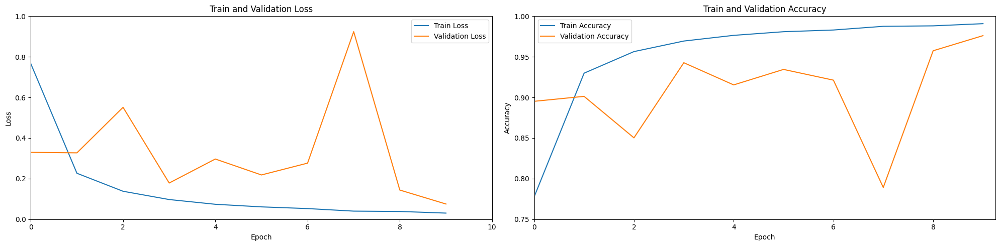

In [12]:
# Plotting the training and validation loss and accuracy ^_^
plt.figure(figsize=(20, 5))

# Subplot for training and validation loss
plt.subplot(1, 2, 1)
plt.title("Train and Validation Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.plot(history.history['loss'], label="Train Loss")
plt.plot(history.history['val_loss'], label="Validation Loss")
plt.xlim(0, 10)
plt.ylim(0.0, 1.0)
plt.legend()

# Subplot for training and validation accuracy
plt.subplot(1, 2, 2)
plt.title("Train and Validation Accuracy")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.plot(history.history['accuracy'], label="Train Accuracy")
plt.plot(history.history['val_accuracy'], label="Validation Accuracy")
plt.xlim(0, 9.25)
plt.ylim(0.75, 1.0)
plt.legend()

plt.tight_layout()


In [24]:
# Obtain and Flatten Labels and Predictions for Validation Data ^_^
import tensorflow as tf
import itertools

# Initialize lists to store labels and predictions
labels = []
predictions = []

# Iterate over the validation generator to get labels and predictions
for x, y in vaild_gen:
    labels.append(list(y.numpy()))#Append true labels
    predictions.append(tf.argmax(model.predict(x), 1).numpy())#Append predicted labels

# Flatten the lists of lists
predictions = list(itertools.chain.from_iterable(predictions))
labels = list(itertools.chain.from_iterable(labels))
   


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━

# **Display model performance :) 📋**

In [25]:
# Print evaluation metrics based on the model's performance ^_^
#All multiplied by 100 and formatted to two decimal places.

#Train Accuracy: retrieves the last recorded training accuracy from the training history
print("Train Accuracy: {:.2f} %".format(history.history['accuracy'][-1]*100))

#Test Accuracy: computes accuracy score by comparing true labels with predicted labels
print("Test Accuracy: {:.2f} %".format(accuracy_score(labels, predictions) * 100))

#Precision Score: computes the precision score using the micro averaging strategy.
print("Precision Score: {:.2f} %".format(precision_score(labels, predictions, average='micro') * 100))

#Recall Score: computes the recall score using the micro averaging strategy
print("Recall Score: {:.2f} %".format(recall_score(labels, predictions, average='micro') * 100))

Train Accuracy: 99.09 %
Test Accuracy: 97.61 %
Precision Score: 97.61 %
Recall Score: 97.61 %


# confusion matrix ..🧮

<Figure size 2000x500 with 0 Axes>

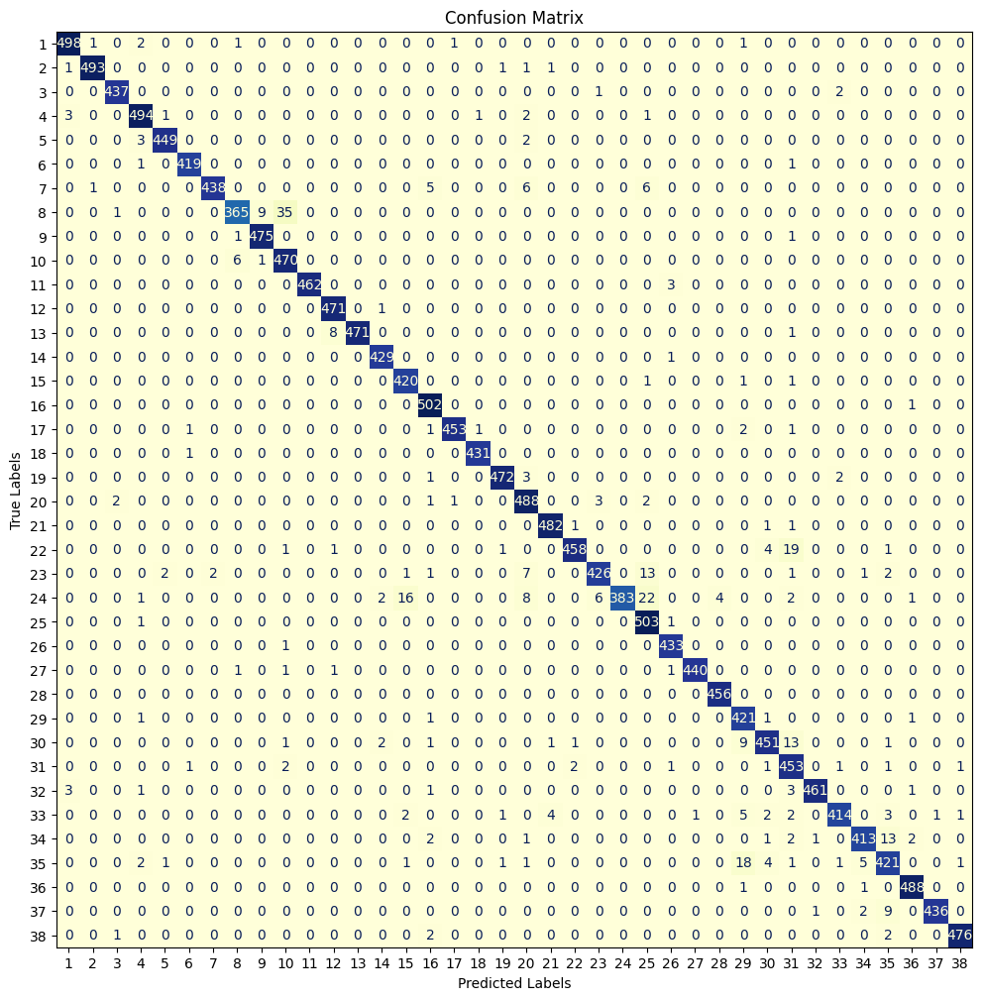

In [26]:
# Plot a confusion matrix based on the true labels and predicted labels ^_^
plt.figure(figsize= (20,5))
cm = confusion_matrix(labels, predictions)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=list(range(1,39)))
fig, ax = plt.subplots(figsize=(12,12))
disp.plot(ax=ax,colorbar= False,cmap = 'YlGnBu')
plt.title("Confusion Matrix")
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()

# visualize and predict one image :)

In [27]:
#prepare the image, make it ready to be predicted bu the model ^_^

# Load and preprocess the image
from tensorflow.keras.preprocessing import image
img_path = '/kaggle/input/new-plant-diseases-dataset/test/test/AppleCedarRust1.JPG'
img = image.load_img(img_path, target_size=(256,256))
img_array = image.img_to_array(img)
img_array = img_array.astype("float32") / 255.0 
img_array = tf.expand_dims(img_array, 0)


Text(0.5, 0.98, '(224, 224, 3)')

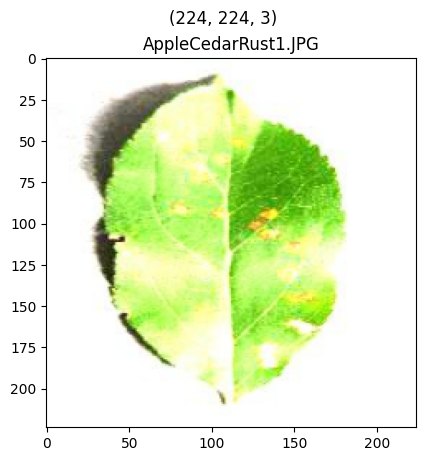

In [29]:
#visualize your image using function load_prep ^_^
def load_prep(img_path):
    img = tf.io.read_file(img_path)
    img = tf.image.decode_image(img)
    img = tf.image.resize(img, size=(224,224))
    return img

# Load and preprocess the image
image = load_prep(img_path)

# Visualize the preprocessed image
plt.imshow(image/255.)
plt.title('AppleCedarRust1.JPG')
plt.suptitle(image.shape)


In [30]:
predictions = model.predict(img_array)
predictions

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


array([[1.86366869e-08, 3.05623587e-07, 9.99961972e-01, 5.13816367e-08,
        1.19796059e-05, 1.64837536e-06, 2.58352628e-07, 9.78257972e-08,
        1.23920401e-07, 6.56269208e-08, 8.89289780e-08, 1.05647746e-06,
        4.23234439e-07, 7.85683696e-08, 3.88962235e-07, 9.37345760e-07,
        1.24177134e-07, 2.26871649e-07, 6.05266905e-07, 5.46833235e-06,
        2.00647901e-06, 1.25060682e-08, 1.46852460e-06, 1.83846601e-06,
        1.05326166e-07, 3.98423410e-08, 3.04526004e-08, 1.83299221e-07,
        4.17214960e-06, 1.82003618e-07, 9.77269607e-08, 2.93522469e-08,
        1.71157509e-07, 2.04592567e-07, 5.76585535e-07, 1.52412576e-06,
        3.35508872e-07, 1.09666382e-06]], dtype=float32)

In [32]:
predicted_class = np.argmax(predictions)
print(f"this image : Predicted Class: {predicted_class}, Class name: {class_names[predicted_class]}")

this image : Predicted Class: 2, Class name: Apple___Cedar_apple_rust


# **Testing model on test data 🧪**
*here we go to the test directory prepare it to apply our model on it let's see :)*


In [35]:
# Predict plant diseases for each image in the test directory ^_^
from tensorflow.keras.preprocessing import image
images_dir ="/kaggle/input/new-plant-diseases-dataset/test/test"

# Iterate through each image in the directory
image_files = os.listdir(images_dir)
for img_file in image_files:
    # Construct the full path to the image
    img_path = os.path.join(images_dir, img_file)
    
    # Load the image and preprocess it
    img = image.load_img(img_path, target_size=(256, 256))
    img_array = image.img_to_array(img)
    img_array = img_array.astype("float32") / 255.0
    img_array_batch = np.expand_dims(img_array, axis=0)
    
    # Make predictions using the model
    predictions = model.predict(img_array_batch)
    predicted_class = np.argmax(predictions)
    
    # Print the prediction results
    print(f"Image: {img_file}, Predicted Class: {predicted_class}, Class name: {class_names[predicted_class]}")

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
Image: TomatoEarlyBlight6.JPG, Predicted Class: 29, Class name: Tomato___Early_blight
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
Image: TomatoYellowCurlVirus4.JPG, Predicted Class: 35, Class name: Tomato___Tomato_Yellow_Leaf_Curl_Virus
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
Image: TomatoYellowCurlVirus6.JPG, Predicted Class: 35, Class name: Tomato___Tomato_Yellow_Leaf_Curl_Virus
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
Image: PotatoHealthy2.JPG, Predicted Class: 22, Class name: Potato___healthy
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
Image: TomatoYellowCurlVirus5.JPG, Predicted Class: 35, Class name: Tomato___Tomato_Yellow_Leaf_Curl_Virus
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
Image: PotatoEarlyBlight2.JPG, Predicted Class: 20, Class name: Potato___Early_blight
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
Image: TomatoYellowCurlVirus3.JPG, Predicted Class: 35, Class name: Tomato___Tomato_Yellow_Leaf_Curl_Virus
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
Image: TomatoEarlyB

# Visualize random images with their predicted classes..🍀
 note that you can increase number of images to br predicted and change style of display..

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


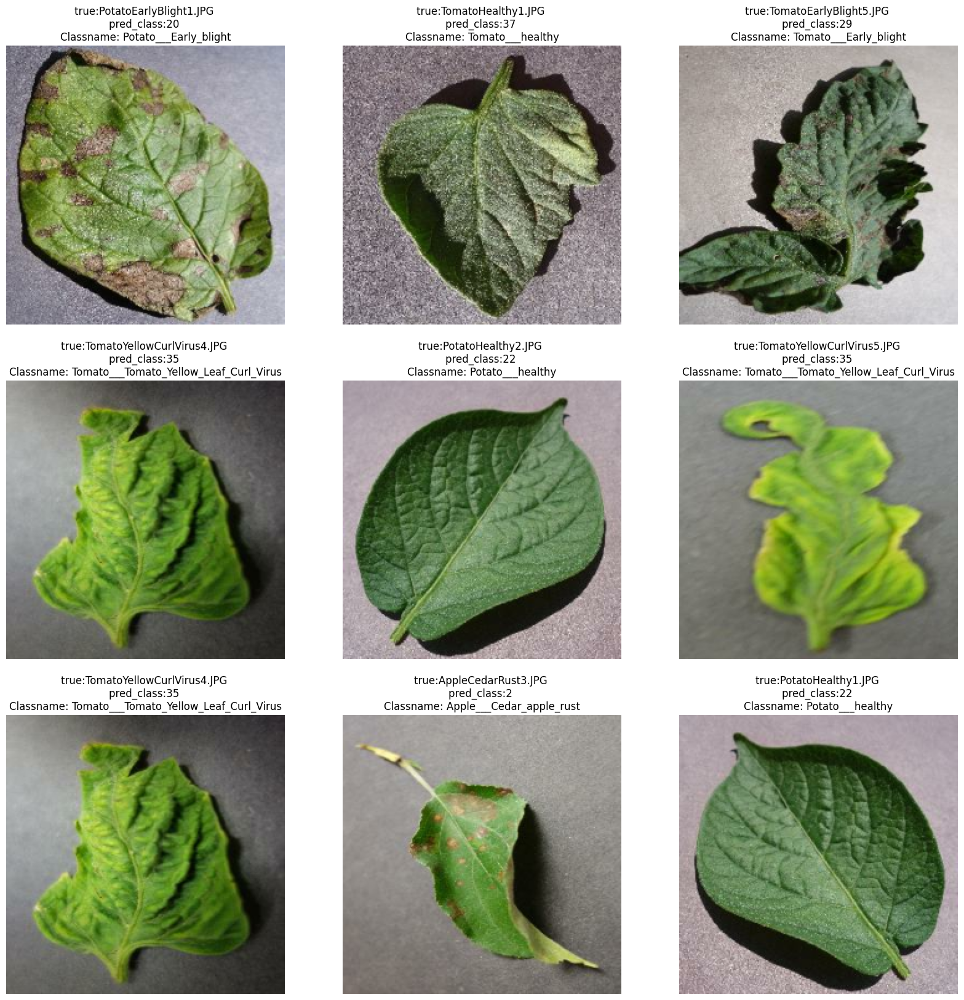

In [38]:
# Create a figure to display the images ^_^
from tensorflow.keras.preprocessing import image
import random 
plt.figure(figsize=(20,20))

# Iterate through 9 random images
for i in range(9):
    plt.subplot(3,3,i+1)
    
    # Select a random image from the directory
    rn = random.choice(os.listdir(images_dir))
    img_path = os.path.join(images_dir, rn)
    
    # Preprocess the image
    new_img = load_prep(img_path)
    
    # Load and preprocess the image for prediction
    photo = image.load_img(img_path, target_size=(256,256))  
    photo_array = image.img_to_array(photo)
    photo_array = photo_array.astype("float32") / 255.0 
    photo_array = tf.expand_dims(photo_array, 0) 
    predictions_photo_array = model.predict(photo_array)
    pred_class_ = np.argmax(predictions_photo_array)
    
    # Display the image and its predicted class
    plt.imshow(new_img/255.)
    plt.title(f'true:{rn} \npred_class:{pred_class_} \nClassname: {class_names[pred_class_]}')
    plt.axis(False)


# **Finally..Saving our model 📂**

In [39]:
# save it as a h5 file ^_^
from tensorflow.keras.models import load_model
model.save('model.h5')